In [1]:
from skimage import io, draw
#import skimage.draw
from matplotlib import pyplot as plt
import os
import numpy as np
import time

%matplotlib inline

In [2]:
photos = []
for f in os.listdir("./data/autumn"):
    photos.append("./data/autumn/"+f)
photos

['./data/autumn/2009-01-07 09:44:55.jpg',
 './data/autumn/2010-11-11 05:39:46.jpg',
 './data/autumn/2014-11-26 20:30:07.jpg',
 './data/autumn/2015-01-23 19:28:53.jpg',
 './data/autumn/2012-11-14 15:37:59.jpg',
 './data/autumn/2013-11-02 20:47:50.jpg',
 './data/autumn/2018-04-21 10:43:36.jpg',
 './data/autumn/2015-07-27 17:22:24.jpg',
 './data/autumn/2012-07-05 16:20:57.jpg',
 './data/autumn/2008-10-27 06:38:52.jpg',
 './data/autumn/2012-10-02 01:08:06.jpg',
 './data/autumn/2014-06-06 20:01:40.jpg',
 './data/autumn/2007-11-13 14:18:04.jpg',
 './data/autumn/2014-06-09 00:01:43.jpg',
 './data/autumn/2013-11-02 21:48:36.jpg',
 './data/autumn/2009-11-30 18:33:22.jpg',
 './data/autumn/2012-06-27 05:11:51.jpg',
 './data/autumn/2010-12-19 01:36:30.jpg',
 './data/autumn/2012-05-20 13:02:17.jpg',
 './data/autumn/2014-08-03 11:00:23.jpg',
 './data/autumn/2018-10-05 10:13:28.jpg',
 './data/autumn/2015-12-01 12:46:11.jpg',
 './data/autumn/2009-11-13 11:47:03.jpg',
 './data/autumn/2013-04-14 11:39:1

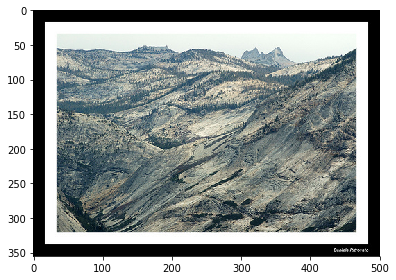

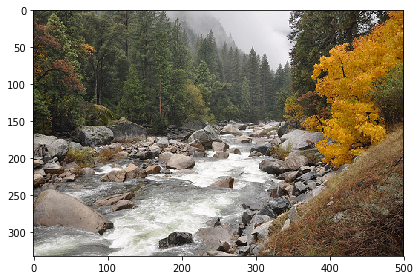

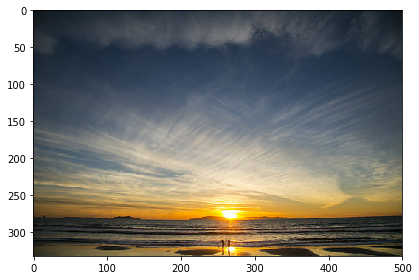

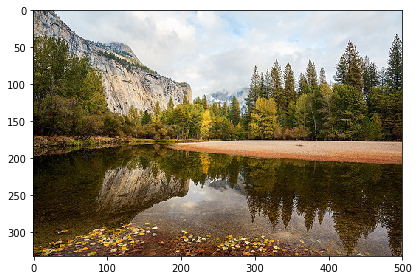

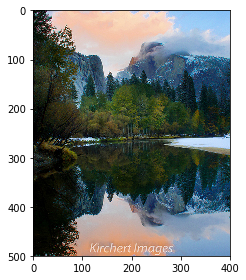

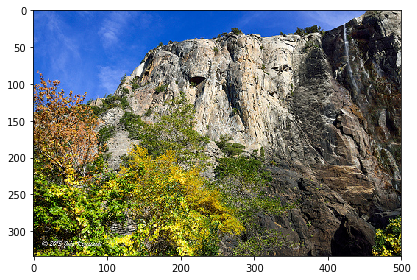

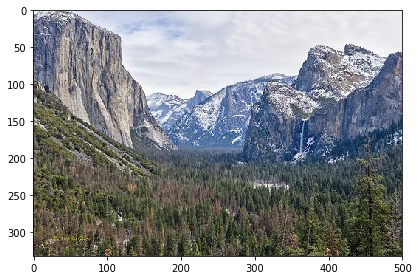

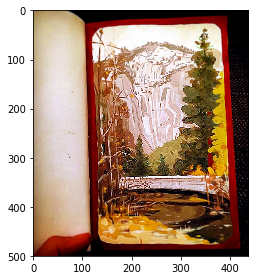

In [3]:
no_face = photos[:8]
for f in no_face:
    io.imshow(f)
    io.show()

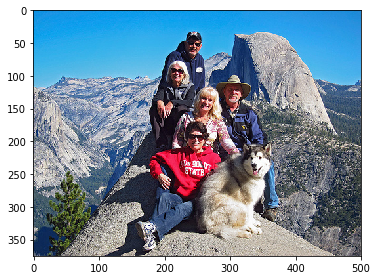

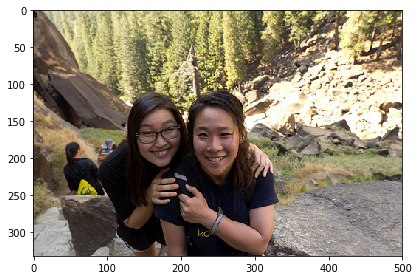

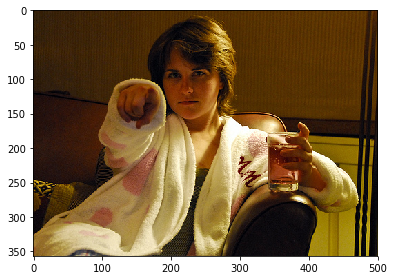

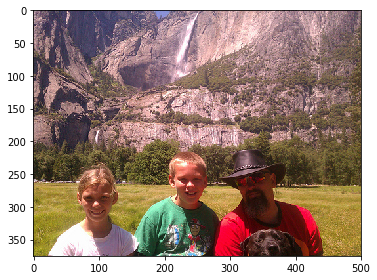

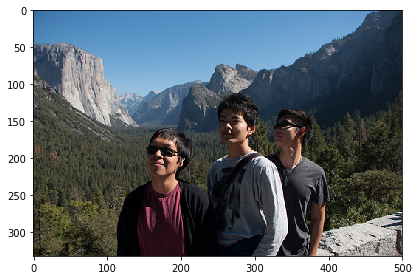

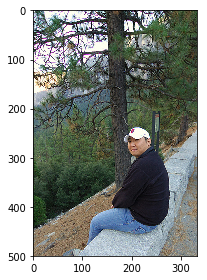

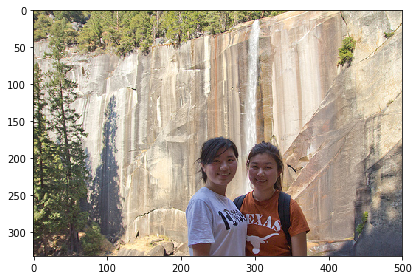

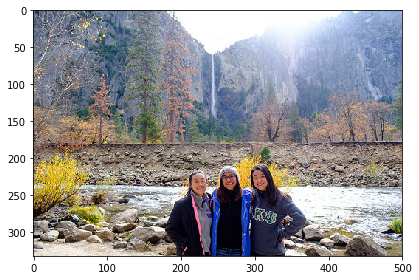

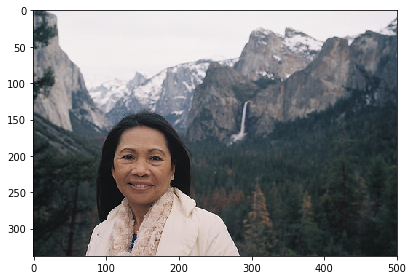

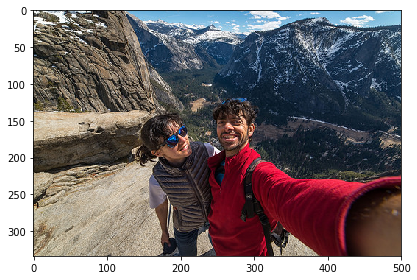

In [4]:
no_face += [photos[i] for i in [14,25,36,41,56,66,71,72,74,131,153,193]]
face = [photos[i] for i in [8,10,12,55,78,93,164,196,242,266]]
for f in face:
    io.imshow(f)
    io.show()

In [5]:
import cv2

In [6]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

img = io.imread(face[0])
faces = face_cascade.detectMultiScale(
    img,
    scaleFactor=1.15,
    minNeighbors=5,
    minSize=(30, 30),
    #flags = cv2.CASCADE_SCALE_IMAGE
)




In [7]:
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

#io.imshow(img)


In [58]:
sf = 1.175
mn = 5
def has_faces(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=sf,
        minNeighbors=mn,
        flags = cv2.CASCADE_SCALE_IMAGE
    )
    return len(faces) != 0

def find_and_display_faces(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=sf,
        minNeighbors=mn,
        flags = cv2.CASCADE_SCALE_IMAGE
    )
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    io.imshow(img)
    plt.show()



In [59]:
print(sum([has_faces(io.imread(p)) for p in face])/len(face))
print(sum([has_faces(io.imread(p)) for p in no_face])/len(no_face))

0.8
0.2


0 0
8


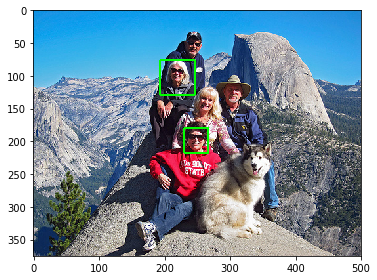

10


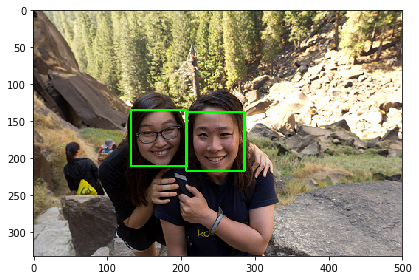

12


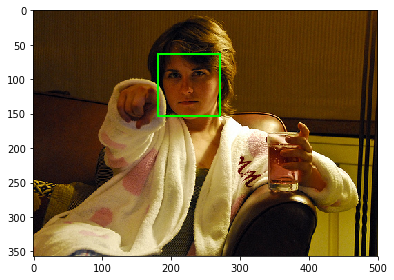

25


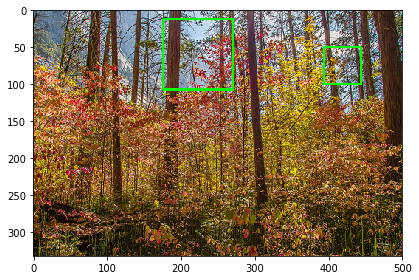

36


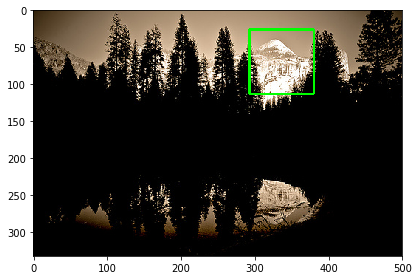

55


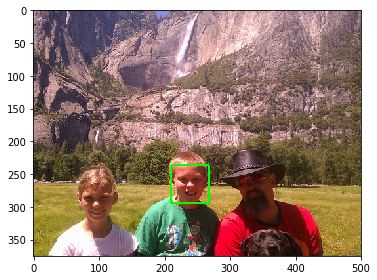

66


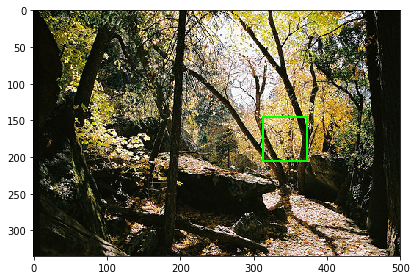

74


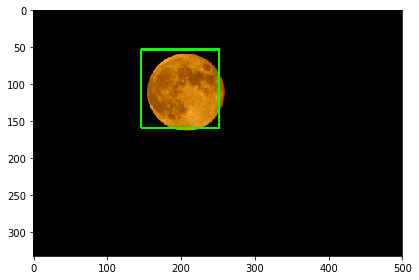

93


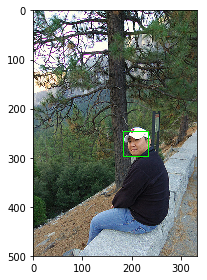

100 9
107


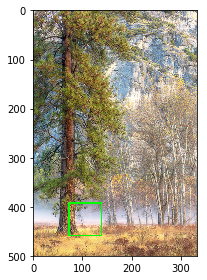

164


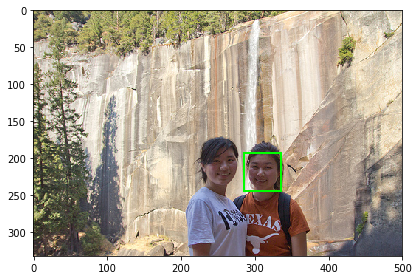

195


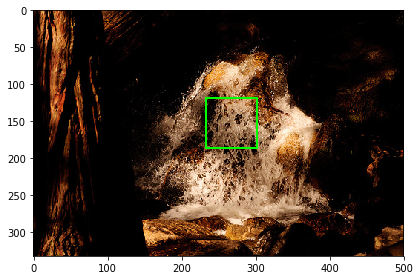

196


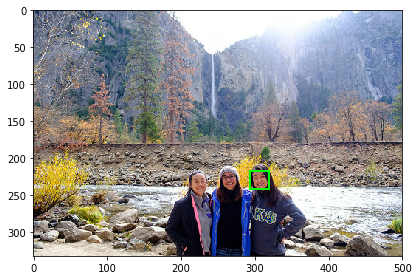

200 13
220


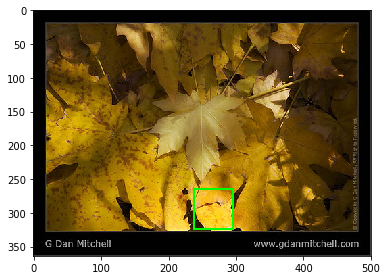

224


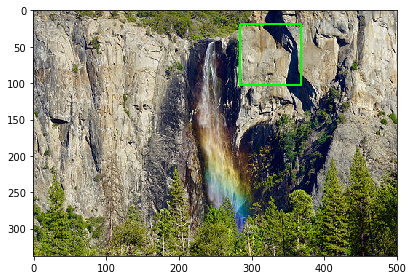

233


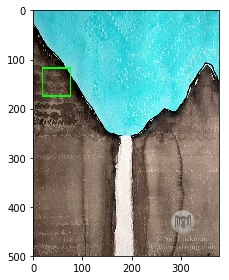

242


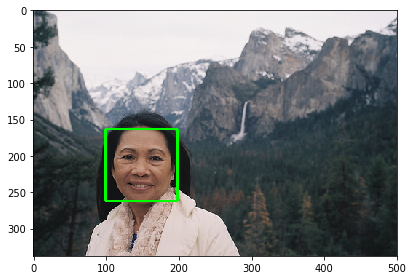

265


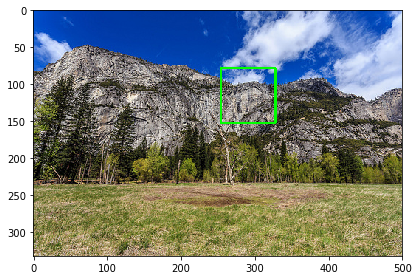

268


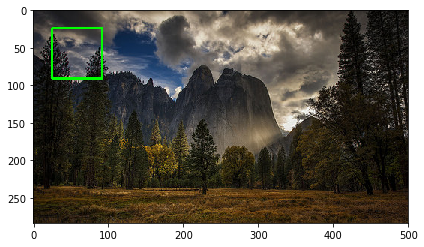

284


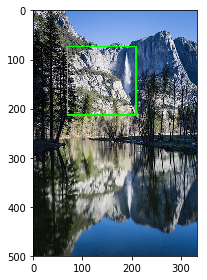

288


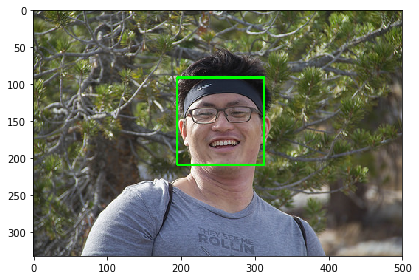

300 21
305


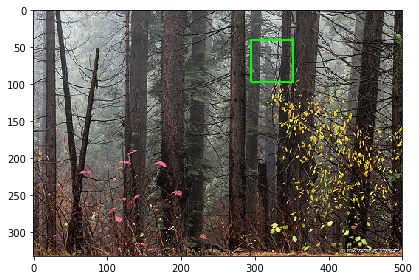

306


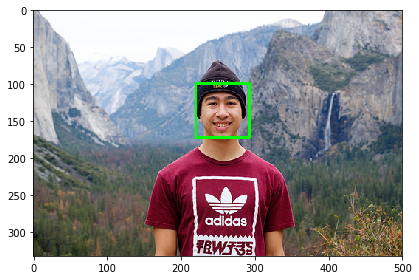

333


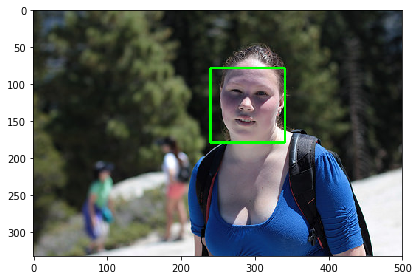

336


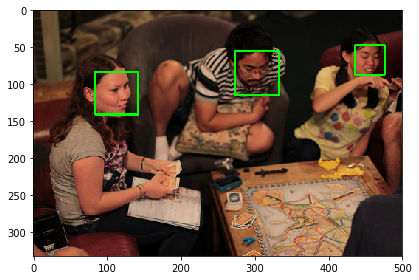

346


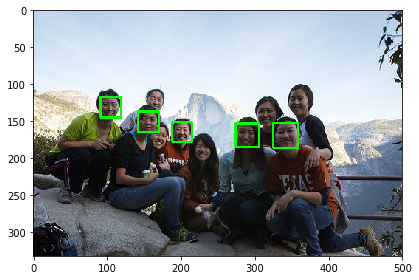

358


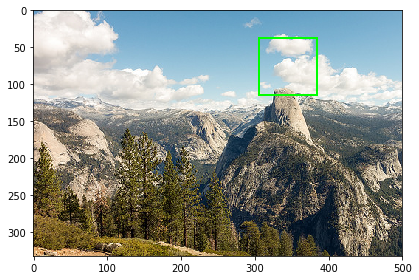

398


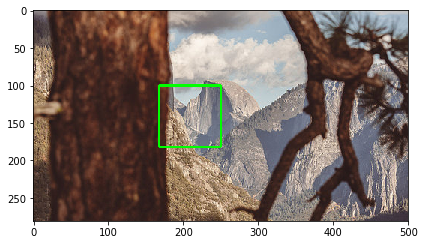

400 28
404


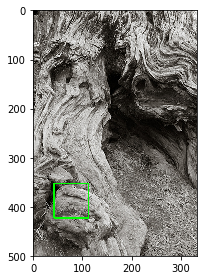

416


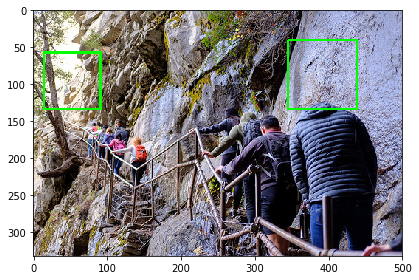

430


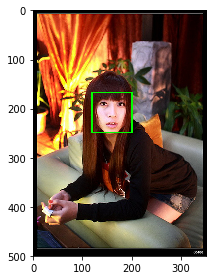

451


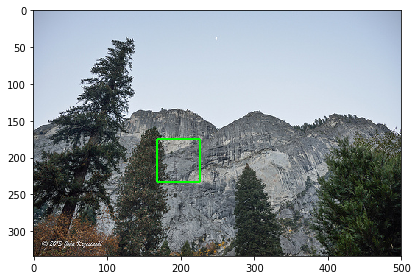

452


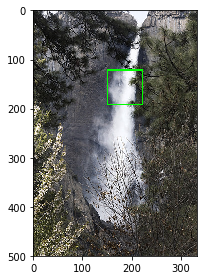

458


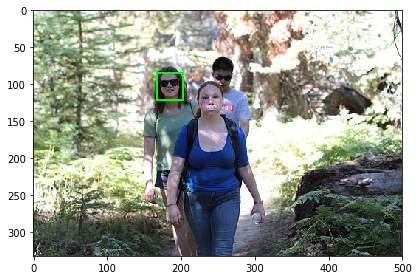

500 34
510


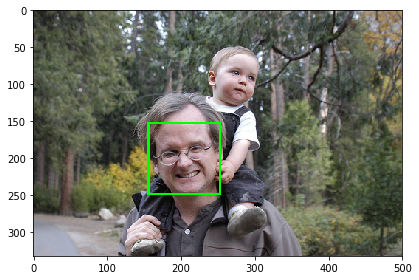

513


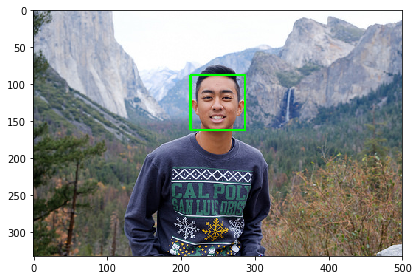

525


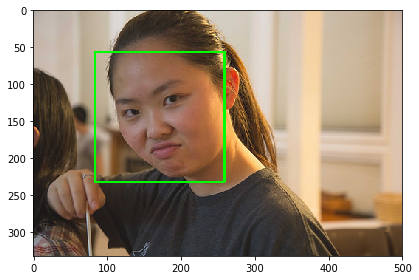

529


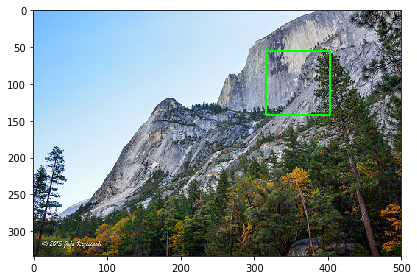

574


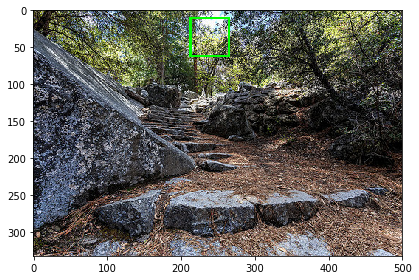

577


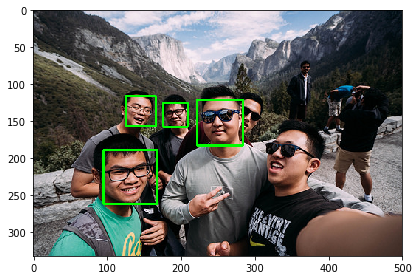

585


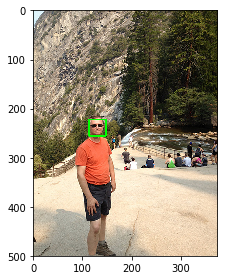

600 41
609


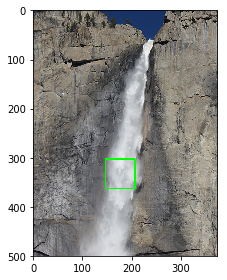

644


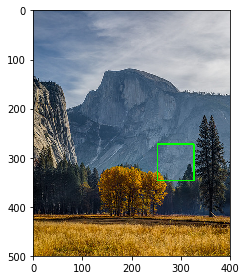

647


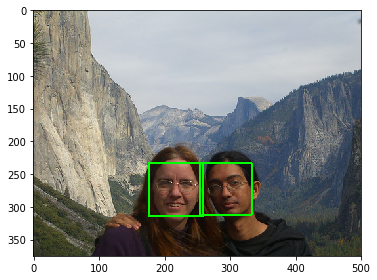

679


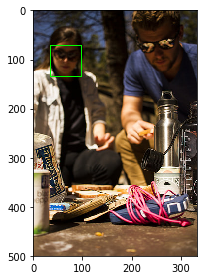

682


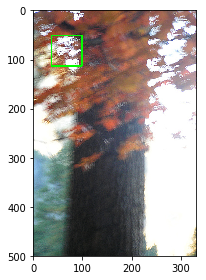

687


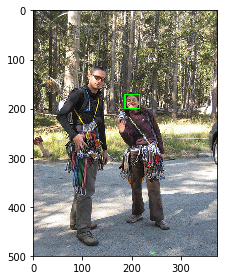

700 47
702


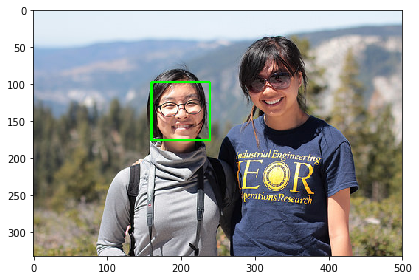

714


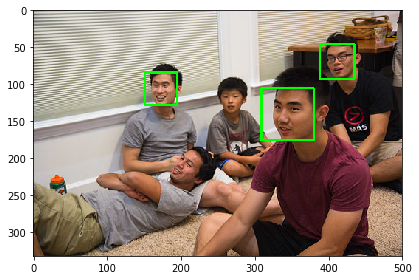

In [ ]:
bw = []
for i, p in enumerate(photos):
    if i % 100 == 0:
        print(i, len(bw))
    im = io.imread(p)

    if has_faces(im):
        bw.append(p)
        print(i)
        find_and_display_faces(im)